In [1]:
import investpy
from datetime import date, datetime, timedelta
from fredapi import Fred
import eurostat
import quandl
import scipy.stats

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, StandardScaler

%matplotlib inline

C:\Users\tsaiy\anaconda3\lib\site-packages\pandasdmx\remote.py:11: RuntimeWarning: optional dependency requests_cache is not installed; cache options to Session() have no effect
  'to Session() have no effect', RuntimeWarning)


# 匯入股市、債市、匯率、大宗商品等資料

In [13]:
#將datetime轉為string，因為investpy的日期輸入格式需要string
freq = 'Monthly'
start = '31/12/2010'
end = datetime.now().strftime("%d/%m/%Y")

#freq = 'Daily'
#start = (datetime.now() - timedelta(720)).strftime("%d/%m/%Y")
#end = datetime.now().strftime("%d/%m/%Y")

#匯率，例如一歐元兌多少美元
EUR = investpy.get_currency_cross_historical_data(currency_cross='EUR/USD', from_date = start, to_date = end, interval = freq)
GBP = investpy.get_currency_cross_historical_data(currency_cross='GBP/USD', from_date = start, to_date = end, interval = freq)
AUD = investpy.get_currency_cross_historical_data(currency_cross='AUD/USD', from_date = start, to_date = end, interval = freq)
#注意JPY已經被乘以100
JPY = investpy.get_currency_cross_historical_data(currency_cross='JPY/USD', from_date = start, to_date = end, interval = freq)
Dollar = investpy.get_index_historical_data(index='US Dollar Index',country='united states', from_date = start, to_date = end, interval = freq)


#指數
SP500 = investpy.get_index_historical_data(index='S&P 500',country='united states', from_date = start, to_date = end, interval = freq)
VIX = investpy.get_index_historical_data(index='S&P 500 VIX',country='united states', from_date = start, to_date = end, interval = freq)
DJI = investpy.get_index_historical_data(index='Dow 30',country='united states', from_date = start, to_date = end, interval = freq)
NAS = investpy.get_index_historical_data(index='NASDAQ',country='united states', from_date = start, to_date = end, interval = freq)
FTSE = investpy.get_index_historical_data(index='FTSE 100',country='united kingdom', from_date = start, to_date = end, interval = freq)
DAX = investpy.get_index_historical_data(index='DAX',country='germany', from_date = start, to_date = end, interval = freq)
CAC = investpy.get_index_historical_data(index='CAC 40',country='france', from_date = start, to_date = end, interval = freq)
SHA = investpy.get_index_historical_data(index ='Shanghai', country='china', from_date = start, to_date = end, interval = freq)
SHE = investpy.get_index_historical_data(index ='SZSE Component', country='china', from_date = start, to_date = end, interval = freq)
HSI = investpy.get_index_historical_data(index ='Hang Seng', country='hong kong', from_date = start, to_date = end, interval = freq)
NK225 = investpy.get_index_historical_data(index ='Nikkei 225', country='japan', from_date = start, to_date = end, interval = freq)
EM = investpy.get_index_historical_data(index ='MSCI Emerging Markets', country='world', from_date = start, to_date = end, interval = freq)


#10年公債
USbond = investpy.bonds.get_bond_historical_data(bond = 'U.S. 10Y', from_date = start, to_date = end, interval = freq)
UKbond = investpy.bonds.get_bond_historical_data(bond = 'U.K. 10Y', from_date = start, to_date = end, interval = freq)
Gerbond = investpy.bonds.get_bond_historical_data(bond = 'Germany 10Y', from_date = start, to_date = end, interval = freq)
Frbond = investpy.bonds.get_bond_historical_data(bond = 'France 10Y', from_date = start, to_date = end, interval = freq)
JPbond = investpy.bonds.get_bond_historical_data(bond = 'Japan 10Y', from_date = start, to_date = end, interval = freq)
Canbond = investpy.bonds.get_bond_historical_data(bond = 'Canada 10Y', from_date = start, to_date = end, interval = freq)


#商品
Gold = investpy.get_commodity_historical_data(commodity='gold', from_date = start, to_date = end, interval = freq)
Silver = investpy.get_commodity_historical_data(commodity='silver', from_date = start, to_date = end, interval = freq)
Copper = investpy.get_commodity_historical_data(commodity='copper', from_date = start, to_date = end, interval = freq)
Soybean = investpy.get_commodity_historical_data(commodity='US Soybeans', from_date = start, to_date = end, interval = freq)
WTI = investpy.get_commodity_historical_data(commodity='Crude Oil WTI', from_date = start, to_date = end, interval = freq)
Brent = investpy.get_commodity_historical_data(commodity='Brent Oil', from_date = start, to_date = end, interval = freq)
Wheat = investpy.get_commodity_historical_data(commodity='US Wheat', from_date = start, to_date = end, interval = freq)
Corn = investpy.get_commodity_historical_data(commodity='US Corn', from_date = start, to_date = end, interval = freq)

#加密貨幣
Bitcoin = investpy.get_crypto_historical_data(crypto='bitcoin', from_date = start, to_date = end, interval = freq)


C:\Users\tsaiy\anaconda3\lib\site-packages\investpy\commodities.py:523: Warning: Note that the displayed commodity data can differ depending on the country. If you want to retrieve copper data from either united states or united kingdom, specify the country parameter.
  warnings.warn(msg, Warning)


# 合併檔案

In [14]:
objs = [EUR.Close, GBP.Close, AUD.Close, JPY.Close, Dollar.Close, SP500.Close, DJI.Close, NAS.Close, VIX.Close, FTSE.Close, DAX.Close, CAC.Close, SHA.Close, SHE.Close, HSI.Close, NK225.Close, EM.Close, USbond.Close, UKbond.Close, Gerbond.Close, Frbond.Close, JPbond.Close, Canbond.Close, Gold.Close, Silver.Close, Copper.Close, Soybean.Close, WTI.Close, Brent.Close, Wheat.Close, Corn.Close, Bitcoin.Close]
name = ['EUR','GBP','AUD','JPY','Dollar','SP500','DJI','NAS','VIX','FTSE','DAX','CAC','SHA','SHE','HSI','NK225','EM','USbond','UKbond','Gerbond','Frbond','JPbond','Canbond','Gold','Silver','Copper','Soybean','WTI','Brent','Wheat','Corn','Bitcoin']

Asset = pd.concat(objs, axis=1, join='outer', ignore_index=False, keys = name)
Asset = Asset.fillna(method='ffill') #使用「最後觀察值法」來處理遺漏值，若有缺失值，則用前一筆來補
Asset

,EUR,GBP,AUD,JPY,Dollar,SP500,DJI,NAS,VIX,FTSE,...,Canbond,Gold,Silver,Copper,Soybean,WTI,Brent,Wheat,Corn,Bitcoin
Date,,,,,,,,,,,,,,,,,,,,,
2011-01-01,1.3686,1.6015,0.9967,1.21835,77.73,1286.12,11891.93,2700.08,19.53,5862.94,...,3.293,1333.80,28.174,4.4510,1410.88,92.19,101.01,838.63,659.50,0.5
2011-02-01,1.3802,1.6258,1.0186,1.22275,76.89,1327.22,12226.34,2782.27,18.35,5994.01,...,3.298,1409.30,33.804,4.4780,1365.88,96.97,111.80,816.38,722.50,0.9
2011-03-01,1.4166,1.6033,1.0328,1.20225,75.86,1325.83,12319.73,2781.07,17.74,5908.76,...,3.353,1438.90,37.872,4.3000,1416.63,106.72,117.36,759.13,693.25,0.8
2011-04-01,1.4802,1.6704,1.0967,1.23110,72.93,1363.61,12810.54,2873.54,14.75,6069.90,...,3.213,1556.00,48.584,4.1650,1394.88,113.93,125.89,804.13,754.00,3.5
2011-05-01,1.4396,1.6451,1.0671,1.22640,74.64,1345.20,12569.79,2835.30,15.45,5989.99,...,3.077,1535.90,38.303,4.1730,1382.38,102.70,116.73,787.13,747.50,8.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-01,1.1231,1.2399,0.6902,0.92640,97.39,3100.29,25812.88,10058.76,30.43,6169.74,...,0.527,1820.40,18.064,2.7135,883.00,39.27,41.15,490.75,338.50,9135.4
2020-07-01,1.1774,1.3088,0.7142,0.94450,93.35,3271.12,26428.32,10745.28,24.46,5897.76,...,0.468,1985.90,24.216,2.8680,897.25,40.27,43.30,531.00,316.00,11333.4
2020-08-01,1.1936,1.3369,0.7375,0.94410,92.14,3500.31,28430.05,11775.46,26.41,5963.57,...,0.624,1978.60,28.594,3.0410,952.50,42.61,45.28,546.50,348.50,11644.2


In [9]:
#輸出excel檔檢查資料是否有問題
Asset.to_excel('after.xlsx')

# 計算5日報酬率

In [4]:
Return = pd.DataFrame([])

Interval = 5

for i in Asset.columns:
    Return[i] = (Asset[i] - Asset[i].shift(Interval))/Asset[i].shift(Interval)*100

Return = Return.replace([-np.inf, np.inf], np.nan)
Return = Return.dropna()
Return

,EUR,GBP,AUD,JPY,Dollar,SP500,DJI,NAS,VIX,FTSE,...,Canbond,Gold,Silver,Copper,Soybean,WTI,Brent,Wheat,Corn,Bitcoin
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-02,-0.798900,-0.787341,-0.263633,-0.255102,0.653388,0.323610,1.263279,-0.527483,-2.900886,-0.939508,...,1.692117,1.658993,2.769640,0.790444,1.433587,4.312257,3.768967,1.952172,0.753941,-2.082461
2018-10-03,-1.128435,-0.698335,-1.742739,-0.733330,0.662252,0.395679,1.398729,-0.264219,-4.207921,0.001065,...,5.109188,0.630567,-0.207147,1.396161,1.924785,4.313993,4.315764,1.126347,2.385965,-1.931887
2018-10-04,-0.809717,-0.084414,-2.171508,-0.198965,0.651740,-0.424505,0.639383,-2.073487,17.326733,-1.223137,...,5.438813,0.535982,-0.686173,-0.575916,1.806337,1.474403,2.248549,1.322233,3.157895,-0.298309
2018-10-05,-0.732191,0.706009,-2.461964,-0.022739,0.515085,-0.974955,-0.042558,-3.205180,22.277228,-2.551996,...,7.169345,0.906440,4.971059,-0.855148,2.808989,1.488055,1.740812,2.098585,3.223546,0.058777
2018-10-06,-0.466402,0.613356,-2.407971,0.176578,0.335782,-1.334204,-0.766044,-3.096189,23.500000,-2.363098,...,3.790902,1.249605,1.095226,-0.507881,1.607247,-1.274900,-0.964933,2.448580,0.683527,-0.180079
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-12,0.236947,-2.833055,0.123728,0.085025,0.657895,-2.509221,-1.662336,-4.062448,-12.617886,1.594806,...,-8.040201,0.557534,-0.768520,-0.983809,2.928123,-4.770408,-5.189241,-1.565164,5.950653,0.626391
2020-09-13,0.560319,-1.493801,0.956474,-0.137858,-0.117723,0.274023,0.599072,0.053929,-14.589955,1.716439,...,-3.003534,0.241869,-0.066689,0.479339,2.585072,1.550598,0.125691,-0.231882,3.988604,1.969072
2020-09-14,0.559227,-1.200000,0.082395,0.435429,-0.214477,-0.453668,0.189188,-0.762102,-10.274210,0.223023,...,-6.879195,0.450151,1.004320,0.540718,2.401341,-2.076216,-2.892866,0.622468,2.142857,4.407996


# 檢查Return是否有nan、infinite

In [6]:
#檢查是否有空值，若有則為True
print(Return.isnull().any())

#檢查是否有infinite value
for i in Return.columns:
    max_value = Return[i].max()
    min_value = Return[i].min()

    print("max:{},min:{}".format(max_value, min_value))

EUR        False
GBP        False
AUD        False
JPY        False
Dollar     False
SP500      False
DJI        False
NAS        False
VIX        False
FTSE       False
DAX        False
CAC        False
SHA        False
SHE        False
HSI        False
NK225      False
EM         False
USbond     False
UKbond     False
Gerbond    False
Frbond     False
JPbond     False
Canbond    False
Gold       False
Silver     False
Copper     False
Soybean    False
WTI        False
Brent      False
Wheat      False
Corn       False
Bitcoin    False
dtype: bool
max:1.4442672337409161,min:-2.0522217132386604
max:2.6583662824934673,min:-3.6840358446730828
max:2.230610844200414,min:-3.839629915188886
max:2.885577378758357,min:-3.1117252674138887
max:1.8090154211150635,min:-1.6823354774863957
max:9.382765710199331,min:-11.98405028365707
max:11.365038487128553,min:-12.92654671300573
max:9.3459968341248,min:-12.321330610752163
max:47.95067101922379,min:-23.373525904332848
max:9.053463332191935,min:-10.8

# 將Return標準化

In [5]:
sc = StandardScaler()

Return_numpy = Return.values #先將Asset轉成numpy
scaled = sc.fit_transform(Return_numpy) #標準化
Return_scaled = pd.DataFrame(index =Return.index ,columns = Return.columns, data = scaled) #轉回dataframe格式

Return_scaled

,EUR,GBP,AUD,JPY,Dollar,SP500,DJI,NAS,VIX,FTSE,...,Canbond,Gold,Silver,Copper,Soybean,WTI,Brent,Wheat,Corn,Bitcoin
Date,,,,,,,,,,,,,,,,,,,,,
2018-10-02,-0.976504,-0.598096,-0.202052,-0.356117,0.835557,0.068382,0.390502,-0.270315,-0.274751,-0.318661,...,0.268098,0.615039,0.524401,0.341405,0.694373,0.341046,0.583898,0.700896,0.249624,-0.332916
2018-10-03,-1.370336,-0.530582,-1.283088,-0.906632,0.846696,0.094170,0.435002,-0.179210,-0.351025,0.052930,...,0.661183,0.139398,-0.165991,0.627331,0.957897,0.341164,0.663096,0.391928,0.829555,-0.314890
2018-10-04,-0.989430,-0.064902,-1.596463,-0.291495,0.833486,-0.199310,0.185532,-0.805327,0.905676,-0.430714,...,0.699102,0.095653,-0.277090,-0.303580,0.894350,0.148342,0.363683,0.465215,1.103857,-0.119321
2018-10-05,-0.896778,0.534662,-1.808749,-0.088631,0.661758,-0.396273,-0.038507,-1.196961,1.194572,-0.955705,...,0.898174,0.266988,1.034966,-0.435390,1.432265,0.149269,0.290143,0.755674,1.127186,-0.076571
2018-10-06,-0.579129,0.464381,-1.769288,0.140814,0.436437,-0.524820,-0.276196,-1.159244,1.265930,-0.881077,...,0.509533,0.425699,0.136062,-0.271464,0.787540,-0.038349,-0.101755,0.886619,0.224602,-0.105167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-12,0.261456,-2.149842,0.081059,0.035422,0.841221,-0.945266,-0.570657,-1.493628,-0.841807,0.682568,...,-0.851464,0.105621,-0.296188,-0.496124,1.496179,-0.275710,-0.713599,-0.615056,2.096250,-0.008617
2020-09-13,0.647924,-1.133971,0.689688,-0.221151,-0.133459,0.050639,0.172288,-0.069111,-0.956891,0.730621,...,-0.272068,-0.040372,-0.133416,0.194549,1.312135,0.153516,0.056210,-0.116231,1.399045,0.152126
2020-09-14,0.646619,-0.911112,0.050849,0.438792,-0.255046,-0.209745,0.037628,-0.351507,-0.705037,0.140619,...,-0.717907,0.055957,0.114979,0.223522,1.213565,-0.092762,-0.380995,0.203410,0.743168,0.444110


# 漲幅最大的5個標的

In [6]:
m = Return_scaled.rank(axis=1)

top_n = 5

topfive = pd.DataFrame({n: m.T[col].nlargest(top_n).index.tolist() for n, col in enumerate(m.T)}).T

topfive = topfive.set_index(Return_scaled.index)

topfive.tail(30)

,0,1,2,3,4
Date,,,,,
2020-08-18,Copper,SHA,JPY,EUR,SHE
2020-08-19,Copper,Silver,Wheat,Soybean,SHA
2020-08-20,Copper,Wheat,Silver,JPY,GBP
2020-08-21,Wheat,Copper,NAS,JPY,Silver
2020-08-22,Wheat,Dollar,NAS,Copper,VIX
2020-08-23,Wheat,Dollar,NAS,VIX,DJI
2020-08-24,Wheat,Corn,DJI,HSI,NAS
2020-08-25,Corn,EM,HSI,UKbond,Canbond
2020-08-26,UKbond,Canbond,Corn,Soybean,DAX


# RORO index

## 風險性資產(risk on)

In [7]:
#三大美指(0.15)、歐洲三大指(0.1)、亞洲股市(0.1)、新興市場(0.05)、商品原物料(包含原油、黃小玉0.2)、銅(0.05)、貨幣(澳幣、歐元、英鎊)(0.3)、比特幣(0.05)

w_us = 0.15/3 
w_eur = 0.1/3
w_asia = 0.1/4
w_em = 0.05
w_com = 0.2/5
w_cop = 0.05
w_cur = 0.3/3
w_bit = 0.05

riskon = w_us*(Return_scaled['SP500'] + Return_scaled['DJI'] + Return_scaled['NAS']) 
+ w_eur*(Return_scaled['FTSE'] + Return_scaled['DAX'] + Return_scaled['CAC'])
+ w_asia*(Return_scaled['SHA'] + Return_scaled['SHE'] + Return_scaled['HSI'] + Return_scaled['NK225'])
+ w_em*Return_scaled['EM']
+ w_com*(Return_scaled['WTI'] + Return_scaled['Brent'] + Return_scaled['Soybean'] + Return_scaled['Wheat'] + Return_scaled['Corn'])
+ w_cop*Return_scaled['Copper']
+ w_cur*(Return_scaled['GBP'] + Return_scaled['AUD'] + Return_scaled['EUR'])
+ w_bit*Return_scaled['Bitcoin']

Date
2018-10-02   -0.016646
2018-10-03   -0.015744
2018-10-04   -0.005966
2018-10-05   -0.003829
2018-10-06   -0.005258
                ...   
2020-09-12   -0.000431
2020-09-13    0.007606
2020-09-14    0.022205
2020-09-15    0.021617
2020-09-16    0.019308
Name: Bitcoin, Length: 708, dtype: float64

## 避險性資產(risk off)

In [8]:
w_dol = 0.2
w_jpy = -0.2
w_vix = 0.2
w_bond = 0.3/6
w_gold = 0.05
w_silver = 0.05 

riskoff = w_dol*Return_scaled['Dollar'] 
+ w_jpy*Return_scaled['JPY']
+ w_vix*Return_scaled['VIX']
+ w_bond*(Return_scaled['USbond'] + Return_scaled['UKbond'] + Return_scaled['Gerbond'] + Return_scaled['Frbond'] + Return_scaled['JPbond'] + Return_scaled['Canbond'])
+ w_gold*Return_scaled['Gold']
+ w_silver*Return_scaled['Silver']

Date
2018-10-02    0.026220
2018-10-03   -0.008300
2018-10-04   -0.013854
2018-10-05    0.051748
2018-10-06    0.006803
                ...   
2020-09-12   -0.014809
2020-09-13   -0.006671
2020-09-14    0.005749
2020-09-15    0.001454
2020-09-16    0.022514
Name: Silver, Length: 708, dtype: float64

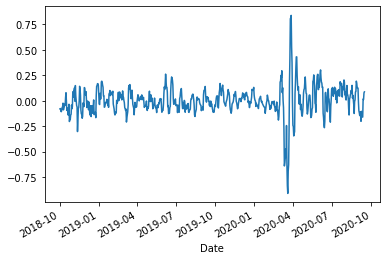

In [10]:
roro = 0.5 * (riskon - riskoff)
roro.plot()

## RORO與美股的相關性

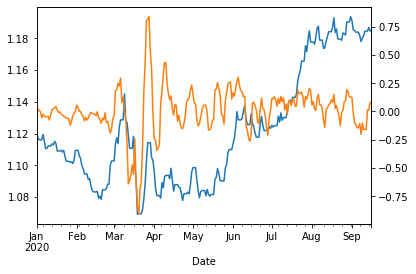

In [13]:
ax = Asset['EUR']['2020-01-01':].plot()
roro['2020-01-01':].plot(ax = ax, secondary_y=True)

## 各類資產與SP500的相關性

In [104]:
corr = pd.DataFrame(columns=['Asset','Corr'])

for i in Asset.columns:
    x = scipy.stats.pearsonr(Return_scaled[i], Return_scaled['SP500'])[0]
    
    new_row = {'Asset':i,'Corr':x}
    
    corr = corr.append(new_row, ignore_index=True)
corr

,Asset,Corr
0,EUR,0.268031
1,GBP,0.437600
2,AUD,0.646820
3,JPY,-0.166722
4,Dollar,-0.326180
5,SP500,1.000000
6,DJI,0.977145
7,NAS,0.948160
8,VIX,-0.702374
9,FTSE,0.726985


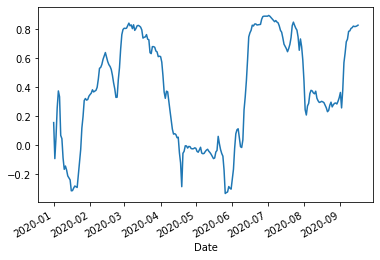

In [21]:
#EUR與SP500的30天期滾動式相關係數
#Return_scaled['EUR'].rolling(30).corr(Return_scaled['SP500'])['2020-01-01':].plot()
Return_scaled['WTI'].rolling(30).corr(Return_scaled['SP500'])['2020-01-01':].tail(180)
Return_scaled['WTI'].rolling(30).corr(Return_scaled['SP500'])['2020-01-01':].plot()

# 各資產間相關係數 

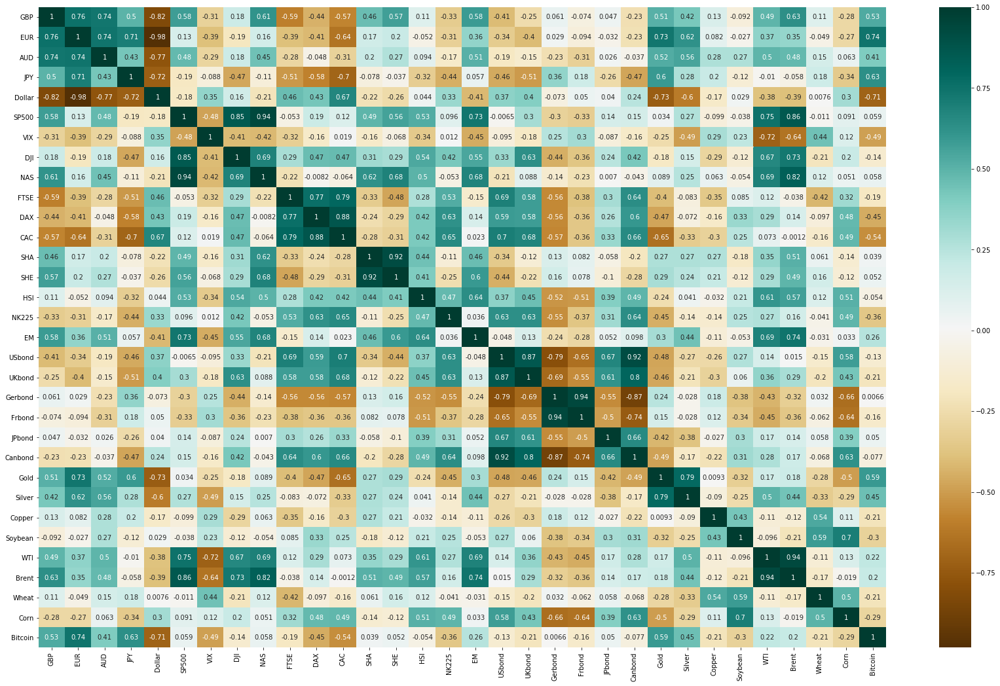

In [38]:
#觀察近60日各資產間的關聯性
plt.figure(figsize=(29,18))
sns.heatmap(Return_scaled.corr(), annot=True, cmap='BrBG')

In [10]:
#搜尋標的的id
#investpy.search_indices(by ='name', value='Dow')

,country,name,full_name,symbol,currency,class,market
0,china,SZSE Downstream Industry,SZSE Downstream Industry,SZDII,CNY,primary_sectors,world_indices
1,china,SSE Downstream Industry,SSE Downstream Industry,SSEDII,CNY,other_indices,world_indices
2,euro zone,The Europe Dow USD,The Europe Dow USD,EDOW,USD,additional_indices,global_indices
3,euro zone,The Europe Dow EUR,The Europe Dow EUR,EDOWE,EUR,major_indices,global_indices
4,russia,Dow Jones Russia Gdr USD,Dow Jones Russia Gdr USD,DJRUSGD,USD,additional_indices,global_indices
5,united states,Dow 30,Dow Jones Industrial Average,DJI,USD,major_indices,world_indices
6,united states,1/100 Dow Jones Industrial Average,1/100 Dow Jones Industrial Average,DJX,USD,other_indices,world_indices
7,united states,Dow Jones U.S. Completion TSM,Dow Jones U.S. Completion TSM,DWCPF,USD,other_indices,world_indices
8,world,Endowment,Endowment,ENDOW,USD,other_indices,global_indices
9,world,Dow Jones-UBS Coffee,Dow Jones-UBS Coffee,BUKCDE,EUR,commodities,global_indices


In [3]:
#讀取經濟數據檔案
eco = pd.read_excel("C:/Users/tsaiy/MyPython/Forex/2011-2020.xlsx")

#重新命名欄位
eco.rename(columns={'Event date':'Date',
                   'Event time(time New York)':'Time',
                   'The degree of volatility':'Vol',
                   'Description of the event':'Event',
                   'Evaluation of the event':'Evaluation'}
          , inplace=True)
#去除不必要的欄位
eco = eco.drop(columns = ['Data format','Time'])
print(eco.columns)
eco.head(10)

Index(['Date', 'Country', 'Vol', 'Event', 'Evaluation', 'Actual', 'Forecast',
       'Previous', 'Revised'],
      dtype='object')


,Date,Country,Vol,Event,Evaluation,Actual,Forecast,Previous,Revised
0,2011/01/01,United Kingdom,Low Volatility Expected,Average Earnings ex Bonus,NaN,2.2,NaN,2.3,NaN
1,2011/01/01,United Kingdom,Low Volatility Expected,BoE Consumer Credit,NaN,0.42,,-0.13,NaN
2,2011/01/01,United Kingdom,Moderate Volatility Expected,BoE QE Total,NaN,200,,200,NaN
3,2011/01/01,United Kingdom,Low Volatility Expected,Core PPI Output,NaN,0.1,,0.2,NaN
4,2011/01/01,United Kingdom,Low Volatility Expected,Core PPI Output,NaN,2,,2.1,NaN
5,2011/01/01,United Kingdom,Moderate Volatility Expected,Core Retail Sales,NaN,-1.7,,0.1,NaN
6,2011/01/01,United Kingdom,Moderate Volatility Expected,Core Retail Sales,NaN,-1.9,,-0.4,NaN
7,2011/01/01,United Kingdom,Low Volatility Expected,Core RPI,NaN,0.7,,0.4,NaN
8,2011/01/01,United Kingdom,Low Volatility Expected,Core RPI,NaN,4.7,,4.7,NaN
9,2011/01/01,United Kingdom,Moderate Volatility Expected,CPI,NaN,1,,0.4,NaN


In [35]:
#先篩國家
eco1 = eco[(eco.Country == 'Euro Zone') | (eco.Country == 'United States')]
#
eco2 = eco1[(eco1.Event == 'Construction PMI') | (eco1.Event == 'GDP')| (eco1.Event == 'Core CPI')|(eco1.Event =='BoE Interest Rate Decision')]
#eco1['Event'].drop_duplicates() 用來確認過濾結果是否正確
eco2

,Date,Country,Vol,Event,Evaluation,Actual,Forecast,Previous,Revised
36,2011/01/01,United States,Moderate Volatility Expected,Core CPI,NaN,0.8,,0.8,NaN
287,2011/01/01,Euro Zone,Low Volatility Expected,Core CPI,NaN,0.4,,-0.1,NaN
375,2011/01/07,Euro Zone,Moderate Volatility Expected,GDP,Worse Than Expected,0.3,0.4,0.4,NaN
476,2011/01/14,Euro Zone,Moderate Volatility Expected,Core CPI,In Line with Expectation,1.1,1.1,1.1,NaN
479,2011/01/14,United States,High Volatility Expected,Core CPI,In Line with Expectation,0.1,0.1,0.1,NaN
...,...,...,...,...,...,...,...,...,...
105707,2020/03/18,Euro Zone,Moderate Volatility Expected,Core CPI,In Line with Expectation,43862,NaN,NaN,NaN
105708,2020/03/18,Euro Zone,Low Volatility Expected,Core CPI,In Line with Expectation,0.4,0.4,0.4,NaN
106010,2020/03/26,United States,High Volatility Expected,GDP,In Line with Expectation,43832,NaN,NaN,NaN
106179,2020/03/31,Euro Zone,Low Volatility Expected,Core CPI,NaN,0.5,NaN,0.4,NaN


# 美國數據

In [1]:
fred = Fred(api_key='c8221ab99f07e4762c840dceb10a89ad') 

#CPI，每月，1947/1/1
print(fred.get_series('CPIAUCSL'))
#核心CPI，每月，1948/1/1
print(fred.get_series('CPILFESL'))
#PPI，每月，1947/4/1
print(fred.get_series('PPIACO'))
#失業率，每月，1948-01-01
print(fred.get_series('UNRATE'))
#工業生產指數，每月，1980-11-03 
print(fred.get_series('INDPRO'))
#GDP saar，每季，1959-01-01
print(fred.get_series('A191RL1Q225SBEA'))
#GDP yoy，每季，1939-01-01 
print(fred.get_series('A191RO1Q156NBEA'))
#M2，每周，1980-11-03 
print(fred.get_series('M2'))
#PCE消費者支出，每月，1959-01-01
print(fred.get_series('PCE'))
#非農就業，每月，1939-01-01
print(fred.get_series('PAYEMS'))
#VIX,每天，1990-01-02
print(fred.get_series('VIXCLS'))
#商品及服務進口，每月，1992-01-01
print(fred.get_series('BOPTIMP'))
#商品及服務出口，每月，1992-01-01
print(fred.get_series('BOPTEXP'))
#非農就業數
print(fred.get_series('PAYEMS'))
#失業率
fred.get_series('UNRATE')
#零售銷售數據
print(fred.get_series('RSAFS'))
#ISM製造業指數，每月，1948/1/1，authtoken="33YRWVbzzyqJ_RJo8Lzj
print(quandl.get("ISM/MAN_PMI"))
#美國散戶投資人情緒
print(quandl.get("AAII/AAII_SENTIMENT"))


NameError: name 'Fred' is not defined

# 每小時薪資年增率

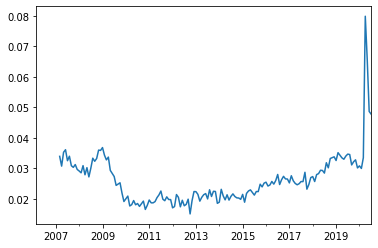

In [12]:
Wage = fred.get_series('CES0500000003')
Wage = pd.Series.to_frame(Wage, name = 'Wage')
Wage['Change'] = (test['Wage'] - test['Wage'].shift(12))/test['Wage'].shift(12)
Wage['Change'].plot()

# PMI資料處理

In [162]:
from sklearn import preprocessing
s = preprocessing.MinMaxScaler()

PMI = quandl.get("ISM/MAN_PMI")

PMI_sc = s.fit_transform(PMI)
PMI['PMI_scaled'] = PMI_sc
PMI

,PMI,PMI_scaled
Date,,
1948-01-01,51.7,0.463617
1948-02-01,50.2,0.432432
1948-03-01,43.3,0.288981
1948-04-01,45.4,0.332640
1948-05-01,49.5,0.417879
...,...,...
2020-03-01,49.1,0.409563
2020-04-01,41.5,0.251559
2020-05-01,43.1,0.284823


# 核心CPI資料處理

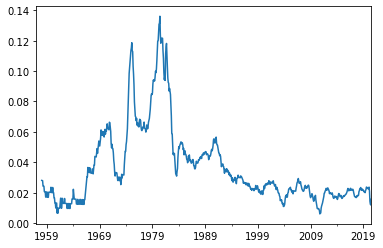

In [181]:
#fred = Fred(api_key='c8221ab99f07e4762c840dceb10a89ad') 
CoreCPI = fred.get_series('CPILFESL')
CoreCPI = pd.Series.to_frame(PCE, name = 'index')
CoreCPI['inflation'] = (CoreCPI.loc[:,'index'] - CoreCPI.loc[:,'index'].shift(12))/ CoreCPI.loc[:,'index'].shift(12)


In [8]:
#總經數據公布日期
fred.get_series_all_releases('PAYEMS').tail()

,realtime_start,date,value
12138,2020-06-05,2020-04-01,130403
12139,2020-07-02,2020-04-01,130303
12140,2020-06-05,2020-05-01,132912
12141,2020-07-02,2020-05-01,133002
12142,2020-07-02,2020-06-01,137802


# 歐元區數據

In [4]:
#Read the table of contents of the main database as a dataframe
toc_df = eurostat.get_toc_df()
toc_df

,title,code,type,last update of data,last table structure change,data start,data end
0,Database by themes,data,folder,,,,
1,General and regional statistics,general,folder,,,,
2,European and national indicators for short-ter...,euroind,folder,,,,
3,Business and consumer surveys (source: DG ECFIN),ei_bcs,folder,,,,
4,Consumer surveys (source: DG ECFIN),ei_bcs_cs,folder,,,,
...,...,...,...,...,...,...,...
9994,Enterprises that provided training to develop/...,isoc_ske_ittn2,dataset,13.01.2020,27.02.2020,2012,2019
9995,Participation in education and training - cont...,sks_devcvt,folder,,,,
9996,Enterprises providing training by type of trai...,trng_cvt_01s,dataset,26.02.2019,27.02.2020,2005,2015
9997,Participants in CVT courses by sex and size cl...,trng_cvt_12s,dataset,26.02.2019,27.02.2020,2005,2015


In [5]:
#Extract from toc_df the row where 'title' contains 'keyword' 
eurostat.subset_toc_df(toc_df, keyword = 'industrial')

,title,code,type,last update of data,last table structure change,data start,data end
1103,Industrial countries' effective exchange rates...,ert_eff_ic_a,dataset,03.06.2020,12.03.2020,1994,2019
1104,Industrial countries' effective exchange rates...,ert_eff_ic_q,dataset,30.07.2020,30.07.2020,1994Q1,2020Q2
1105,Industrial countries' effective exchange rates...,ert_eff_ic_m,dataset,30.07.2020,30.07.2020,1994M01,2020M06
5172,Industrial crops by NUTS 2 regions,ef_lac_indus,dataset,21.02.2020,27.02.2020,2013,2016
5234,Industrial crops: number of farms and areas by...,ef_alindcrop,dataset,16.01.2017,27.02.2020,2005,2013
5328,Industrial plants: number of farms and areas b...,ef_lu_aliplant,dataset,26.03.2009,27.02.2020,1990,2007
5597,Industrial roundwood by assortment,for_irass,dataset,21.04.2020,27.02.2020,1992,2018
5598,Industrial roundwood by species,for_irspec,dataset,21.04.2020,27.02.2020,1992,2018
6666,Gas prices for industrial consumers - bi-annua...,nrg_pc_203_h,dataset,25.02.2010,27.02.2020,1985S1,2007S2
6668,Electricity prices for industrial consumers - ...,nrg_pc_205_h,dataset,25.02.2010,27.02.2020,1985S1,2007S2


# 歐元區GDP

In [97]:
#Read a dataset from the main database and returns it as a pandas dataframe
df = eurostat.get_data_df('namq_10_gdp')
df = df.rename(columns={'geo\\time':'geo'})
#geo代表國家，s_adj代表是否做季節和月份的調整
#unit代表數據要表示的單位
#na_item為要查的數據，例如GDP為「BIGQ」
GDP = df[(df.geo == 'EA19') & (df.s_adj == 'SCA') & (df.unit == 'CLV10_MEUR') & (df.na_item =='B1GQ')]
GDP

,unit,s_adj,na_item,geo,2020Q2,2020Q1,2019Q4,2019Q3,2019Q2,2019Q1,...,1977Q2,1977Q1,1976Q4,1976Q3,1976Q2,1976Q1,1975Q4,1975Q3,1975Q2,1975Q1
4809,CLV10_MEUR,SCA,B1GQ,EA19,2273898.9,2587192.6,2683384.3,2682473.8,2675096.0,2669803.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [100]:
#GDP = GDP.drop(columns=['na_item','s_adj','unit', 'geo'])
GDP.columns = pd.to_datetime(GDP.columns, format='%YQ%m')
GDP = GDP.transpose()
GDP = GDP.rename(columns={4809:'GDP'})
GDP.index.name = 'date'
GDP

,GDP
date,
2020-02-01,2273898.9
2020-01-01,2587192.6
2019-04-01,2683384.3
2019-03-01,2682473.8
2019-02-01,2675096.0
...,...
1976-01-01,NaN
1975-04-01,NaN
1975-03-01,NaN


# 歐元區工業生產指數

In [50]:
#工業生產指數
df = eurostat.get_data_df('sts_inpr_m')
df = df.rename(columns={'geo\\time':'geo'})
df
#geo代表國家，s_adj代表是否做季節和月份的調整
#unit代表數據要表示的單位
#na_item為要查的數據，例如GDP為「BIGQ」
IP = df[(df.geo == 'EA19') & (df.s_adj == 'SCA') & (df.unit == 'I15') & (df.nace_r2 == 'B-D')]

#以下為資料處理
#IP = IP.drop(columns=['indic_bt', 'nace_r2','s_adj','unit', 'geo'])
#IP.columns = pd.to_datetime(IP.columns, format='%YM%m')
#IP = IP.transpose()
#IP = IP.rename(columns={515:'industrial production'})
#IP.index.name = 'date'

# 歐元區消費者信心

In [88]:
df = eurostat.get_data_df('ei_bssi_m_r2')
df = df.rename(columns={'geo\\time':'geo'})
#df
#geo代表國家，s_adj代表是否做季節和月份的調整
#unit代表數據要表示的單位
#na_item為要查的數據，例如GDP為「BIGQ」
SENT = df[(df.geo == 'EA19') & (df.s_adj == 'SA') & (df.indic == 'BS-ESI-I')]

#以下為資料處理
#SENT = SENT.drop(columns=['indic', 's_adj','geo'])
#SENT.columns = pd.to_datetime(SENT.columns, format='%YM%m')
#SENT = SENT.transpose()
#SENT = SENT.rename(columns={148:'sentiment'})
#SENT.index.name = 'date'

In [135]:
dic = eurostat.get_dic('unit')
dic

{'TOTAL': 'Total',
 'NR': 'Number',
 'NR_HAB': 'Number per inhabitant',
 'THS': 'Thousand',
 'MIO': 'Million',
 'BN': 'Billion',
 'CT': 'Euro cent',
 'EUR': 'Euro',
 'THS_EUR': 'Thousand euro',
 'MIO_EUR': 'Million euro',
 'BN_EUR': 'Billion euro',
 'MEUR_KP11': 'Million euro (at constant 2011 prices)',
 'MEUR_KP10': 'Million euro (at constant 2010 prices)',
 'MEUR_KP05': 'Million euro (at constant 2005 prices)',
 'MEUR_KP00': 'Million euro (at constant 2000 prices)',
 'MEUR_KP_PRE': 'Million euro (at prices of the previous year)',
 'MEUR_CLV10': 'Million euro, chain-linked volumes, reference year 2010 (at 2010 exchange rates)',
 'MEUR_NSA': 'Million euro (NSA)',
 'MIO_EUR_NSA': 'Million euro (NSA)',
 'MIO_EUR_SCA': 'Million euro (SCA)',
 'MIO-EUR-SA': 'Trade value - million of euro - seasonally and working day adjusted',
 'MIO-EUR-NSA': 'Trade value - million of euro - not seasonally adjusted',
 'EUR_M3_CLV10': 'Euro per cubic metre (Euro: chain-linked volumes, reference year 2010, at

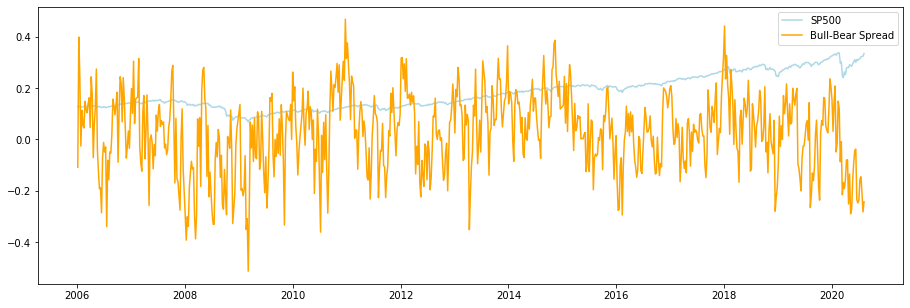

In [37]:
SENT = quandl.get("AAII/AAII_SENTIMENT")['Bull-Bear Spread']

test = SP500.merge(SENT,on = 'Date',how = 'inner')

plt.figure(figsize=(15.5,5.1))
plt.plot(test['Close']*0.0001,'#ADD8E6')
plt.plot(test['Bull-Bear Spread'],'orange')


plt.legend(["SP500", "Bull-Bear Spread"], loc ="upper right") 

plt.show() 

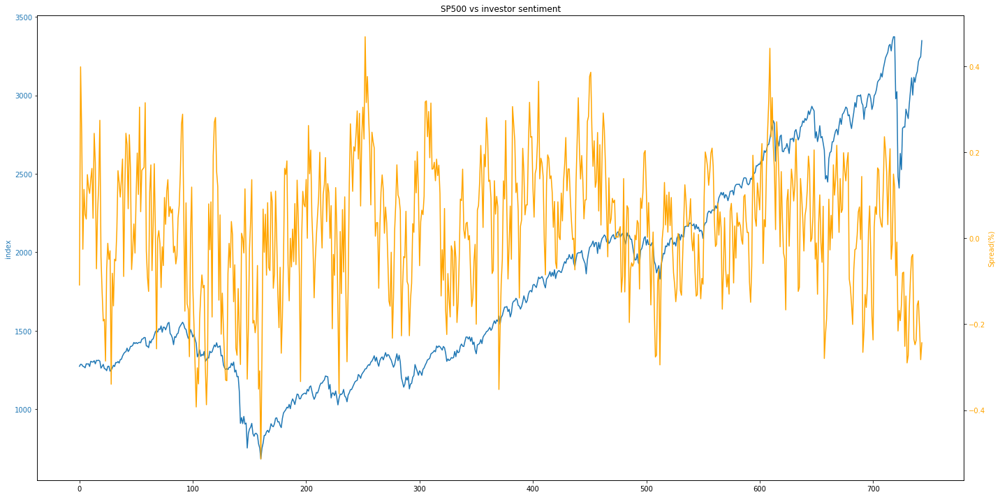

In [49]:
#先製作出第一個subplot，然後把圖表的標題、X軸都設定好，再複製出第二個subplot
fig, ax1 = plt.subplots(figsize=(20,10))
plt.title('SP500 vs investor sentiment')
ax2 = ax1.twinx()

#設定第一個subplot，給定顏色、Y軸等等的
ax1.set_ylabel('index', color='tab:blue')
ax1.plot(range(len(test['Close'])), test['Close'], color='tab:blue', alpha=1)
ax1.tick_params(axis='y', labelcolor='tab:blue')

#換第二個subplot
ax2.set_ylabel('Spread(%)', color='orange')
ax2.plot(range(len(test['Close'])), test['Bull-Bear Spread'], color='orange', alpha=1)
ax2.tick_params(axis='y', labelcolor='orange')

#tight_layout命令主要用於自動調整繪圖區的大小及間距
fig.tight_layout()
#plt.legend(["SP500", "Bull-Bear Spread"], loc ="upper right") 
plt.show()

# 預測模型

## 資料前處理

In [40]:
from sklearn.linear_model import LinearRegression

Return['RORO'] = roro
Return

#split_date = pd.Timestamp('01-01-2010')
#train = EUR[:split_date]


#X = test[['RORO']]
#y = test[['EUR']]
#reg = LinearRegression().fit(X, y)
#reg.score(X, y)
#reg.coef_
#reg.intercept_


,EUR,GBP,AUD,JPY,Dollar,SP500,DJI,NAS,VIX,FTSE,...,Gold,Silver,Copper,Soybean,WTI,Brent,Wheat,Corn,Bitcoin,RORO
Date,,,,,,,,,,,,,,,,,,,,,
2018-02-20,-1.343355,-0.730548,-0.780365,-1.130213,1.275539,-0.547012,-0.934986,-0.304833,7.684266,0.165312,...,-1.591457,0.000000,-1.266577,0.170898,0.912944,1.430126,-2.654388,-0.611829,11.969354,-0.185137
2018-02-21,-0.983395,-0.883065,-1.377480,-1.355518,1.010101,-1.130582,-1.671730,-0.293392,2.877698,-0.179994,...,-1.528084,0.000000,-0.743826,1.248470,0.000000,0.894510,-2.292576,-0.476190,2.891332,-0.162675
2018-02-22,-0.604546,-0.612448,-0.859345,-0.409313,0.718294,-1.034324,-1.018661,-0.405831,-3.802672,-0.580010,...,-1.473018,0.000000,0.000000,1.003672,1.767185,2.390500,-1.582969,-0.204082,-11.123854,-0.118533
2018-02-23,-0.910850,-0.534112,-0.871983,-0.536891,0.875421,0.551932,0.359287,1.352585,-15.262076,-0.689405,...,5.812662,0.000000,-0.714073,1.542228,2.965003,3.809377,-1.310044,-0.272294,-2.196407,-0.094212
2018-02-24,-0.926821,-0.271332,-0.871983,-0.271826,0.875421,0.551932,0.359287,1.352585,-15.262076,-0.044842,...,6.024633,0.000000,-0.714073,1.542228,1.875601,2.497335,-1.310044,-0.272294,-13.117088,-0.094212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-11,0.059132,-3.681674,0.054953,0.063755,0.657895,-2.509221,-1.662336,-4.062448,-12.617886,4.018051,...,0.373586,-0.687794,-1.138396,2.928123,-3.664516,-6.633849,-1.565164,5.111591,0.910998,-0.165759
2020-09-12,0.236947,-2.833055,0.123728,0.085025,0.657895,-2.509221,-1.662336,-4.062448,-12.617886,1.594806,...,0.557534,-0.768520,-0.983809,2.928123,-4.770408,-5.189241,-1.565164,5.950653,0.626391,-0.165759
2020-09-13,0.517871,-1.378301,0.942612,-0.095440,-0.181935,0.274023,0.599072,0.053929,-14.589955,1.716439,...,0.355084,-0.066689,0.634711,2.585072,1.877040,0.050277,-0.231882,3.988604,1.969072,0.031722


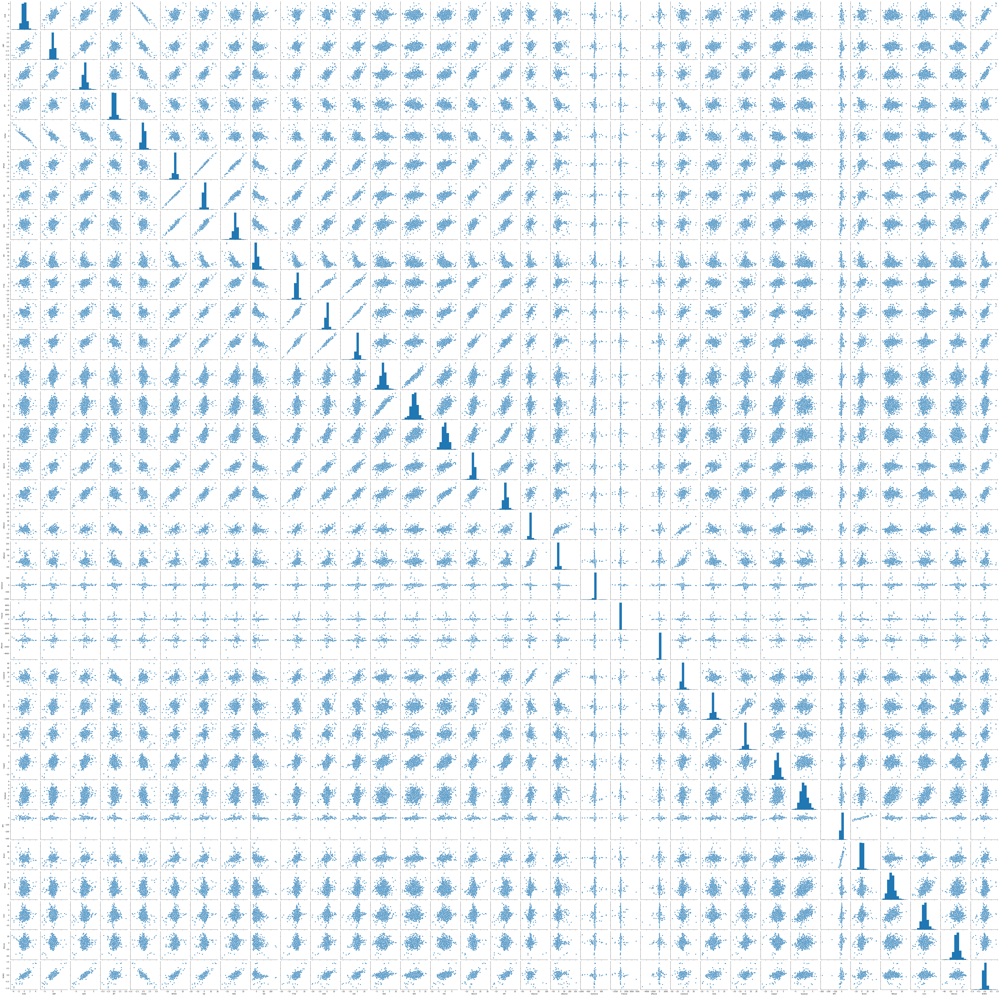

In [41]:
#import seaborn as sns 

#sns.pairplot(Return)